<a href="https://colab.research.google.com/github/Moe-phantom/Moe-phantom/blob/main/CoCoa_Disease_Starter_Notebook_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Check GPU type
!nvidia-smi

Sat Mar  8 08:26:41 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   59C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# Install ultralytics
!pip -q install  ultralytics
!pip install albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.1/949.1 kB 25.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.3 MB/s eta 0:00:00


In [ ]:
# mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import libraries
import pandas as pd
import os
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm.notebook import tqdm
import cv2
import yaml
import matplotlib.pyplot as plt
from ultralytics import YOLO
import multiprocessing
import numpy as np
from PIL import Image
import albumentations as A #for image augementation

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# INPUT_DIRS
INPUT_DATA_DIR = Path('./drive/MyDrive')

In [ ]:
os.listdir(INPUT_DATA_DIR)

['SampleSubmission.csv',
 'Test.csv',
 'Train.csv',
 'dataset.zip',
 'Train_augmented.csv']

In [ ]:
## Drop the Folder if it already exists
DATASETS_DIR = Path('dataset')
DATASETS_DIR

PosixPath('dataset')

In [ ]:
# Image & labels directory
TRAIN_IMAGES_DIR = DATASETS_DIR / 'images' / 'train'
TRAIN_LABELS_DIR = DATASETS_DIR / 'labels'/ 'train'
TEST_IMAGES_DIR = DATASETS_DIR / 'images' / 'test'
VAL_IMAGES_DIR = DATASETS_DIR / 'images' /'val'
VAL_LABELS_DIR = DATASETS_DIR / 'labels' /'val'

In [ ]:
# Check if DATASETS_DIR exists, if it does delete it and recreate it
for DIR in [TRAIN_IMAGES_DIR, VAL_IMAGES_DIR, TEST_IMAGES_DIR, VAL_LABELS_DIR, DATASETS_DIR]:
  if DIR.exists():
    shutil.rmtree(DIR)
  DIR.mkdir(parents=True, exist_ok = True)

In [ ]:
# Unpack the 'dataset.zip'
shutil.unpack_archive(INPUT_DATA_DIR / 'dataset.zip', DATASETS_DIR)

In [ ]:
def count_files(directory):
    total_files = 0
    for root, _, files in os.walk(directory):
        total_files += len(files)
    return total_files

In [ ]:
## Count the number files in TRAIN_IMAGES_DIR
num_train_images = count_files(TRAIN_IMAGES_DIR)
print(f"There are {num_train_images} in {TRAIN_IMAGES_DIR}")

There are 5529 in dataset/images/train


In [ ]:
## Count the number of files in TRAIN_LABELS_DIR
num_train_labels = count_files(TRAIN_LABELS_DIR)
print(f"There are {num_train_labels} in {TRAIN_LABELS_DIR}")

There are 5529 in dataset/labels/train


In [ ]:
## Get the set of all the stems of the images in TRAIN_IMAGES_DIR
train_images_stems = set([str(Path(name).stem) for name in os.listdir(TRAIN_IMAGES_DIR)])
len(train_images_stems)

5529

In [ ]:
## Get the set of all the stems of the labes in TRAIN_LABELS_DIR
train_labels_stems = set([str(Path(name).stem) for name in os.listdir(TRAIN_LABELS_DIR)])
len(train_labels_stems)

5529

In [ ]:
# Check that the two sets are identitical
train_images_stems == train_labels_stems

True

In [ ]:
TRAIN_IMAGES_DIR.absolute()

PosixPath('/content/dataset/images/train')

In [ ]:
# Load train and test files
train = pd.read_csv(INPUT_DATA_DIR / 'Train.csv')
test = pd.read_csv(INPUT_DATA_DIR / 'Test.csv')
ss = pd.read_csv(INPUT_DATA_DIR / 'SampleSubmission.csv')

In [ ]:
## Sample submission file
ss.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_Genxyu.jpg,healthy,0.5,100,100,100,100
1,ID_svY6TG.jpg,healthy,0.5,100,100,100,100
2,ID_d0gpda.jpg,healthy,0.5,100,100,100,100
3,ID_frWmBT.jpg,healthy,0.5,100,100,100,100
4,ID_TaRW6o.jpg,healthy,0.5,100,100,100,100


In [ ]:
train.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,class_id,ImagePath
0,ID_nBgcAR.jpg,healthy,1.0,75.0,15.0,162.0,195.0,2,dataset/images/train/ID_nBgcAR.jpg
1,ID_nBgcAR.jpg,healthy,1.0,58.0,1.0,133.0,171.0,2,dataset/images/train/ID_nBgcAR.jpg
2,ID_nBgcAR.jpg,healthy,1.0,42.0,29.0,377.0,349.0,2,dataset/images/train/ID_nBgcAR.jpg
3,ID_Kw2v8A.jpg,healthy,1.0,112.0,124.0,404.0,341.0,2,dataset/images/train/ID_Kw2v8A.jpg
4,ID_Kw2v8A.jpg,healthy,1.0,148.0,259.0,413.0,412.0,2,dataset/images/train/ID_Kw2v8A.jpg


In [ ]:
# Number of unique images path
train['ImagePath'].nunique()

5529

In [ ]:
# Split the train dataset into train_df & val_df
train_names, val_names = train_test_split(train['Image_ID'].unique(), test_size=0.15, random_state=42)
train_df = train[train['Image_ID'].isin(train_names)]
val_df = train[train['Image_ID'].isin(val_names)]

In [ ]:
train_df.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,class_id,ImagePath
0,ID_nBgcAR.jpg,healthy,1.0,75.0,15.0,162.0,195.0,2,dataset/images/train/ID_nBgcAR.jpg
1,ID_nBgcAR.jpg,healthy,1.0,58.0,1.0,133.0,171.0,2,dataset/images/train/ID_nBgcAR.jpg
2,ID_nBgcAR.jpg,healthy,1.0,42.0,29.0,377.0,349.0,2,dataset/images/train/ID_nBgcAR.jpg
3,ID_Kw2v8A.jpg,healthy,1.0,112.0,124.0,404.0,341.0,2,dataset/images/train/ID_Kw2v8A.jpg
4,ID_Kw2v8A.jpg,healthy,1.0,148.0,259.0,413.0,412.0,2,dataset/images/train/ID_Kw2v8A.jpg


In [ ]:
train_df.shape, val_df.shape, test.shape

((8236, 9), (1556, 9), (1626, 9))

In [ ]:
ss.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_Genxyu.jpg,healthy,0.5,100,100,100,100
1,ID_svY6TG.jpg,healthy,0.5,100,100,100,100
2,ID_d0gpda.jpg,healthy,0.5,100,100,100,100
3,ID_frWmBT.jpg,healthy,0.5,100,100,100,100
4,ID_TaRW6o.jpg,healthy,0.5,100,100,100,100


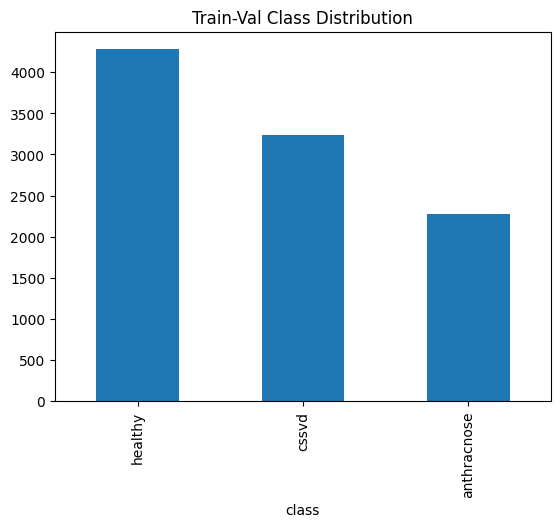

In [ ]:
# Preview target distribution, seems there a class imbalance that needs to be handled
train['class'].value_counts().plot(kind='bar')
plt.title('Train-Val Class Distribution')
plt.show();

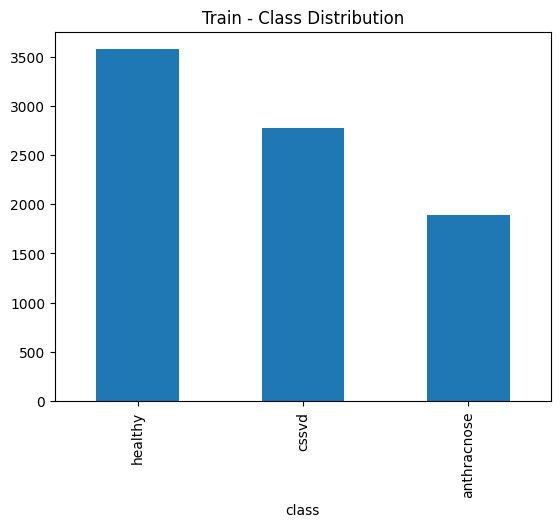

In [ ]:
train_df['class'].value_counts().plot(kind='bar')
plt.title('Train - Class Distribution')
plt.show();

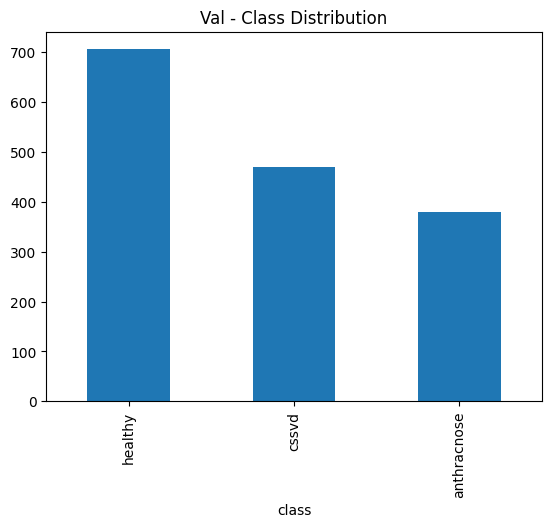

In [ ]:
val_df['class'].value_counts().plot(kind='bar')
plt.title('Val - Class Distribution')
plt.show();

In [ ]:
# Create a data.yaml file required by yolo
class_names = sorted(train['class'].unique().tolist())
num_classes = len(class_names)

data_yaml = {
    "path" : str(DATASETS_DIR.absolute()),
    'train': str(TRAIN_IMAGES_DIR.absolute()),
    'val': str(VAL_IMAGES_DIR.absolute()),
    'test': str(TEST_IMAGES_DIR.absolute()),
    'nc': num_classes,
    'names': class_names
}

yaml_path = 'data.yaml'
with open(yaml_path, 'w') as file:
    yaml.dump(data_yaml, file, default_flow_style=False)

# Preview data yaml file
data_yaml

{'path': '/content/dataset',
 'train': '/content/dataset/images/train',
 'val': '/content/dataset/images/val',
 'test': '/content/dataset/images/test',
 'nc': 3,
 'names': ['anthracnose', 'cssvd', 'healthy']}

In [ ]:
len(val_names), len(set(val_names))

(830, 830)

In [ ]:
val_image_names = [str(Path(name).stem) for name in val_df['Image_ID'].unique()]

In [ ]:
len(val_image_names)

830

In [ ]:
# list of images in TRAIN_IMAGES_DIR
images_in_train_dir = os.listdir(TRAIN_IMAGES_DIR)
len(images_in_train_dir), len(train_names)

(5529, 4699)

In [ ]:
train_image_names = [str(Path(name).stem) for name in train['ImagePath'].unique()]

In [ ]:
len(train_image_names)

5529

In [ ]:
# Check that VAL_IMAGES_DIR & VAL_LABELS_DIR exist if not create them
for DIR in [VAL_IMAGES_DIR, VAL_LABELS_DIR]:
  if not DIR.exists():
    DIR.mkdir(parents=True, exist_ok = True)

In [ ]:
# After defining train_df and val_df
print("Train class distribution before augmentation:")
print(train_df['class'].value_counts())


Train class distribution before augmentation:
class
healthy        3574
cssvd          2771
anthracnose    1891
Name: count, dtype: int64


In [ ]:
# Create a mapping from string labels to integer IDs
class_to_id = train_df[['class', 'class_id']].drop_duplicates().set_index('class')['class_id'].to_dict()
class_to_id

{'healthy': 1, 'anthracnose': 0, 'cssvd': 0}

In [ ]:

# Get initial counts of bounding boxes per class
class_counts = train_df['class'].value_counts()
target_count = class_counts.max()
print(target_count)
print( class_counts)

3574
class
healthy        3574
cssvd          2771
anthracnose    1891
Name: count, dtype: int64


In [ ]:
#transform = A.Compose([
 # A.Rotate(limit=30, p=0.5),
  #A.HorizontalFlip(p=0.5),

#], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'], min_visibility=0.1))
transform = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        A.RandomBrightnessContrast(p=0.3),
    ],
    bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels'])
)


In [ ]:
AUG_IMAGES_DIR = DATASETS_DIR / 'images' / 'aug'
AUG_LABELS_DIR = DATASETS_DIR / 'labels' / 'aug'

# Ensure output directories exist
AUG_IMAGES_DIR.mkdir(parents=True, exist_ok=True)
AUG_LABELS_DIR.mkdir(parents=True, exist_ok=True)


In [ ]:
# Process each image and its labels
for img_name in os.listdir(TRAIN_IMAGES_DIR):
    if not img_name.endswith(('.jpg', '.png')):
        continue

    # Paths
    src_img_path = TRAIN_IMAGES_DIR / img_name
    src_label_path = TRAIN_LABELS_DIR / img_name.replace('.jpg', '.txt').replace('.png', '.txt')
    new_img_name = f"aug_{img_name}"
    new_label_name = new_img_name.replace('.jpg', '.txt').replace('.png', '.txt')
    aug_img_path = AUG_IMAGES_DIR / new_img_name
    aug_label_path = AUG_LABELS_DIR / new_label_name

    # Load image (assuming OpenCV, adjust if using PIL)
    import cv2
    image = cv2.imread(str(src_img_path))
    if image is None:
        print(f"Failed to load image: {img_name}")
        continue

    # Load bounding boxes from label file
    with open(src_label_path, 'r') as f:
        boxes = [list(map(float, line.split())) for line in f]

    # Convert YOLO to Pascal VOC and clip
    valid_bboxes_pascal = []  # Store in Pascal VOC format
    valid_labels = []
    for b in boxes:
        class_id, x_center, y_center, width, height = b
        if width <= 0 or height <= 0:
            print(f"Skipping invalid box in {img_name}: {b}")
            continue

        # Convert YOLO to Pascal VOC
        x_min = x_center - width / 2
        y_min = y_center - height / 2
        x_max = x_center + width / 2
        y_max = y_center + height / 2

        # Clip to [0.0, 1.0]
        x_min = max(0.0, min(1.0, x_min))
        y_min = max(0.0, min(1.0, y_min))
        x_max = max(0.0, min(1.0, x_max))
        y_max = max(0.0, min(1.0, y_max))

        valid_bboxes_pascal.append((x_min, y_min, x_max, y_max))
        valid_labels.append(int(class_id))

    # Apply augmentation
    try:
        augmented = transform(
            image=image,
            bboxes=valid_bboxes_pascal,
            class_labels=valid_labels
        )
    except Exception as e:
        print(f"Augmentation failed for {img_name}: {e}")
        continue

    # Save augmented image
    cv2.imwrite(str(aug_img_path), augmented['image'])

    # Convert augmented Pascal VOC boxes back to YOLO
    aug_bboxes = augmented['bboxes']
    aug_labels = augmented['class_labels']
    aug_bboxes_yolo = []
    for bbox in aug_bboxes:
        x_min, y_min, x_max, y_max = bbox
        # Convert to YOLO
        width = x_max - x_min
        height = y_max - y_min
        x_center = (x_min + x_max) / 2
        y_center = (y_min + y_max) / 2

        # Clip again to ensure validity
        x_center = max(0.0, min(1.0, x_center))
        y_center = max(0.0, min(1.0, y_center))
        width = max(0.0, min(1.0, width))
        height = max(0.0, min(1.0, height))

        aug_bboxes_yolo.append((x_center, y_center, width, height))

    # Save the augmented YOLO boxes
    with open(aug_label_path, 'w') as f:
        for label, bbox in zip(aug_labels, aug_bboxes_yolo):
            f.write(f"{label} {bbox[0]} {bbox[1]} {bbox[2]} {bbox[3]}\n")

print("Augmentation complete!")

Augmentation complete!


In [ ]:
# Oversample underrepresented classes by bounding boxes
for class_name in ['anthracnose', 'cssvd']:
    target_class_id = class_to_id[class_name]

    # Get unique images containing this class and current count of bounding boxes
    class_images = train_df[train_df['class'] == class_name]['Image_ID'].unique()
    current_count = train_df[train_df['class'] == class_name].shape[0]
    num_to_add = target_count - current_count

    print(f"Oversampling {class_name}: adding {num_to_add} instances")

    added = 0
    i = 0

    while added < num_to_add and i < len(class_images):
        img_name = class_images[i % len(class_images)]
        src_img_path = TRAIN_IMAGES_DIR / img_name
        src_label_path = TRAIN_LABELS_DIR / img_name.replace('.jpg', '.txt')

        if src_img_path.exists() and src_label_path.exists():
            img = cv2.imread(str(src_img_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            with open(src_label_path, 'r') as f:
                boxes = [list(map(float, line.split())) for line in f]

            # Filter invalid boxes and prepare for augmentation
            valid_bboxes = []
            valid_labels = []
            for b in boxes:
                class_id, x_center, y_center, width, height = b
                if width <= 0 or height <= 0:
                    print(f"Skipping invalid box in {img_name}: {b}")
                    continue
                valid_bboxes.append((x_center, y_center, width, height))
                valid_labels.append(int(class_id))

            if not valid_bboxes:
                print(f"No valid boxes in {img_name}, skipping")
                i += 1
                continue

            # Clip coordinates before augmentation to fix errors
            valid_bboxes_clipped = [
                (
                    max(0., min(1., x_center)),
                    max(0., min(1., y_center)),
                    max(0., min(1., width)),
                    max(0., min(1., height))
                )
                for x_center, y_center, width, height in valid_bboxes
            ]

            # Augment
            try:
                augmented = transform(image=img, bboxes=valid_bboxes_clipped, class_labels=valid_labels)
                aug_img = augmented['image']
                aug_bboxes = augmented['bboxes']
                aug_labels = augmented['class_labels']
            except ValueError as e:
                print(f"Augmentation failed for {img_name}: {e}")
                i += 1
                continue

            if not aug_bboxes:
                print(f"No boxes survived augmentation in {img_name}")
                i += 1
                continue

            # Clip coordinates after augmentation (already in code, kept for safety)
            aug_bboxes_clipped = [
                (
                    max(0., min(1., x_center)),
                    max(0., min(1., y_center)),
                    max(0., min(1., width)),
                    max(0., min(1., height))
                )
                for x_center, y_center, width, height in aug_bboxes
            ]

            # Save
            new_img_name = f"{Path(img_name).stem}_aug_{i}.jpg"
            new_label_name = new_img_name.replace('.jpg', '.txt')
            cv2.imwrite(str(TRAIN_IMAGES_DIR / new_img_name), cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR))
            with open(TRAIN_LABELS_DIR / new_label_name, 'w') as f:
                for bbox_clipped, label in zip(aug_bboxes_clipped, aug_labels):
                    f.write(f"{label} {bbox_clipped[0]} {bbox_clipped[1]} {bbox_clipped[2]} {bbox_clipped[3]}\n")

            # Count how many were added for the target class
            num_added_for_class = sum(1 for label in aug_labels if label == target_class_id)
            added += num_added_for_class
        i += 1

print(f"Total train images after augmentation: {len(os.listdir(TRAIN_IMAGES_DIR))}")

Oversampling anthracnose: adding 1683 instances
Augmentation failed for ID_xL4khd.jpg: Expected y_min for bbox [    0.16667 -5.0664e-07     0.88542     0.99531           0] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Augmentation failed for ID_rEvHcO.jpg: Expected x_min for bbox [-4.9919e-07     0.54453     0.22917     0.89453           0] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Augmentation failed for ID_CLt0Sv.jpg: Expected y_min for bbox [    0.71042 -5.0664e-07           1     0.88672           0] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Augmentation failed for ID_v1PbJC.jpg: Expected y_min for bbox [   0.004902 -5.0664e-07     0.68096     0.75705           0] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Augmentation failed for ID_gOLdbn.jpg: Expected x_min for bbox [-4.9174e-07     0.15781     0.49062     0.68984           0] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Augmentation failed for ID_mksN0

In [ ]:
print(f"Total train images after augmentation: {len(os.listdir(TRAIN_IMAGES_DIR))}")

Total train images after augmentation: 7654


In [ ]:
train_aug = pd.read_csv(INPUT_DATA_DIR / 'Train_augmented.csv')

class_counts = train_aug['class'].value_counts()
print( class_counts)

class
cssvd          12964
anthracnose     9084
healthy         4280
Name: count, dtype: int64


In [ ]:

class_counts = train_df['class'].value_counts()
target_count = class_counts.max()

for class_name in ['anthracnose', 'cssvd']:
    class_images = train_df[train_df['class'] == class_name]['Image_ID'].unique()
    current_count = train_df[train_df['class'] == class_name].shape[0]
    num_to_add = target_count - current_count
    print(f"Oversampling {class_name}: adding {num_to_add} instances")

    added = 0
    i = 0
    while added < num_to_add and i < len(class_images):
        img_name = class_images[i % len(class_images)]
        src_img_path = TRAIN_IMAGES_DIR / img_name
        src_label_path = TRAIN_LABELS_DIR / img_name.replace('.jpg', '.txt')

        if src_img_path.exists() and src_label_path.exists():
            img = cv2.imread(str(src_img_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            with open(src_label_path, 'r') as f:
                boxes = [list(map(float, line.split())) for line in f]

            # Filter invalid boxes
            valid_bboxes = []
            valid_labels = []
            for b in boxes:
                class_id, x_center, y_center, width, height = b
                if width <= 0 or height <= 0:
                    print(f"Skipping invalid box in {img_name}: {b}")
                    continue
                valid_bboxes.append((x_center, y_center, width, height))
                valid_labels.append(int(class_id))

            if not valid_bboxes:
                print(f"No valid boxes in {img_name}, skipping")
                i += 1
                continue

            # Augment
            try:
                augmented = transform(image=img, bboxes=valid_bboxes, class_labels=valid_labels)
                aug_img = augmented['image']
                aug_bboxes = augmented['bboxes']
                aug_labels = augmented['class_labels']
            except ValueError as e:
                print(f"Augmentation failed for {img_name}: {e}")
                i += 1
                continue

            if not aug_bboxes:
                print(f"No boxes survived augmentation in {img_name}")
                i += 1
                continue

            # Clip coordinates
            aug_bboxes = [
                (
                    min(max(x_center, 0), 1),
                    min(max(y_center, 0), 1),
                    min(max(width, 0), 1),
                    min(max(height, 0), 1)
                )
                for x_center, y_center, width, height in aug_bboxes
            ]

            # Save
            new_img_name = f"{Path(img_name).stem}_aug_{i}.jpg"
            new_label_name = new_img_name.replace('.jpg', '.txt')
            cv2.imwrite(str(TRAIN_IMAGES_DIR / new_img_name), cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR))
            with open(TRAIN_LABELS_DIR / new_label_name, 'w') as f:
                for bbox, label in zip(aug_bboxes, aug_labels):
                    f.write(f"{label} {bbox[0]} {bbox[1]} {bbox[2]} {bbox[3]}\n")

            added += len(aug_bboxes)
        i += 1

print(f"Total train images after augmentation: {len(os.listdir(TRAIN_IMAGES_DIR))}")

In [ ]:
# Copy images in val_names to dataset/val and do the same with the labels
for image_name in tqdm(val_names):
    shutil.move(AUG_IMAGES_DIR / image_name, VAL_IMAGES_DIR / image_name)
    img_ext = image_name.split('.')[-1]
    label_name = image_name.replace(f'.{img_ext}', '.txt')
    shutil.move(AUG_LABELS_DIR / label_name, VAL_LABELS_DIR / label_name)

  0%|          | 0/830 [00:00<?, ?it/s]

FileNotFoundError: [Errno 2] No such file or directory: 'dataset/images/aug/ID_UkhG0l.JPG'

Plotting ID_fWxHlM.jpg with 1 bounding boxes.


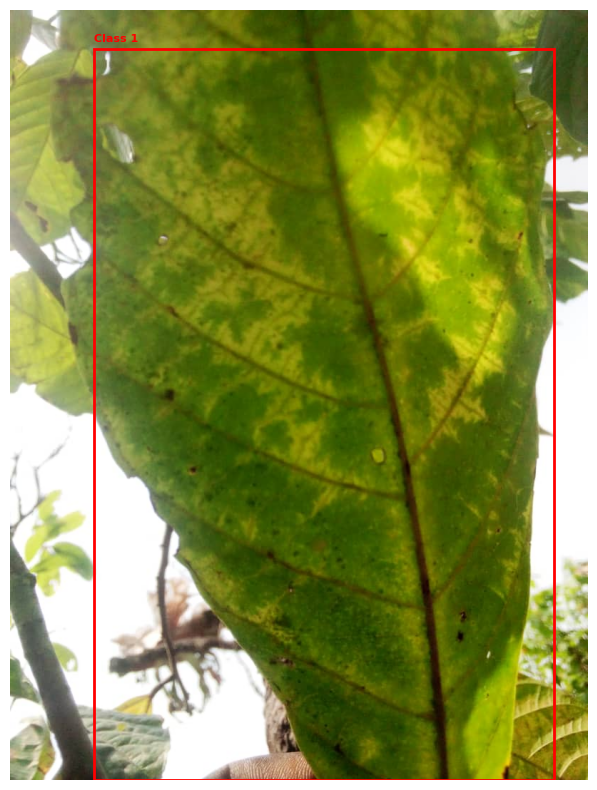

Plotting ID_tCMK8W.jpeg with 3 bounding boxes.


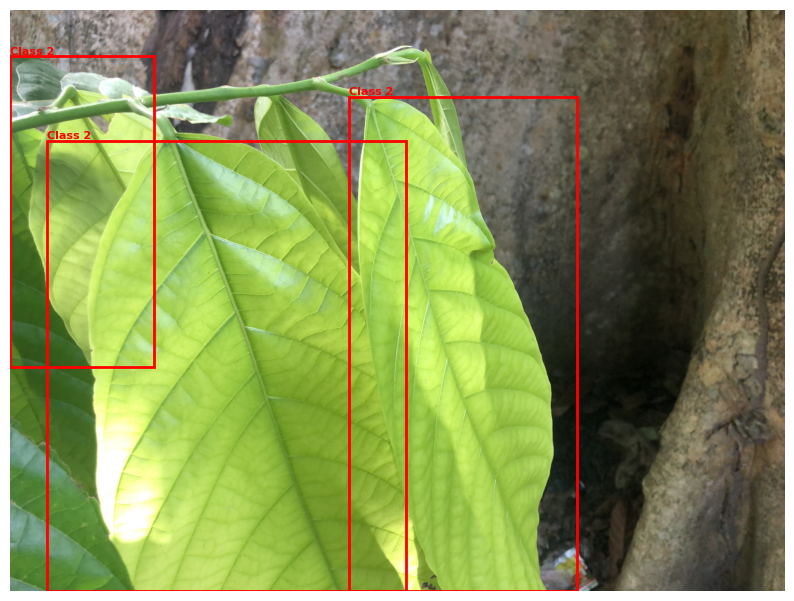

Plotting ID_WWh9Q6.jpg with 1 bounding boxes.


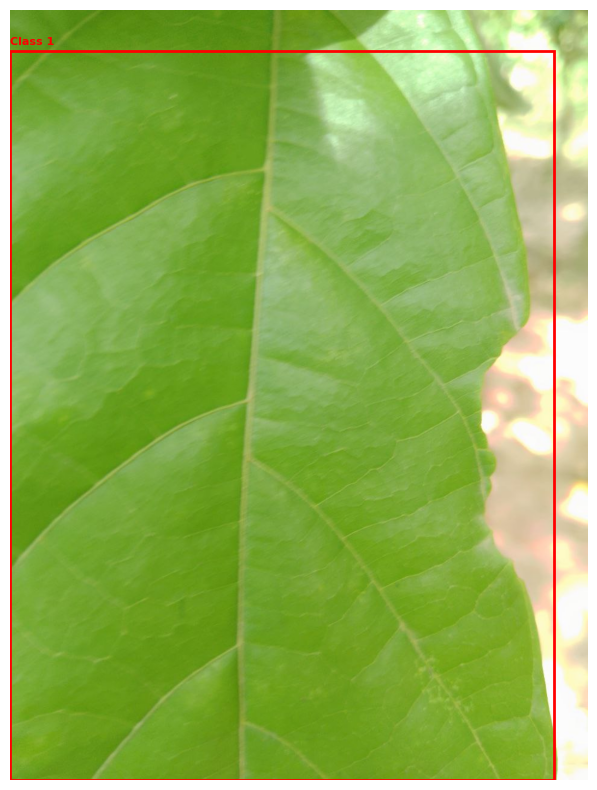

Plotting ID_uIlr19.jpeg with 1 bounding boxes.


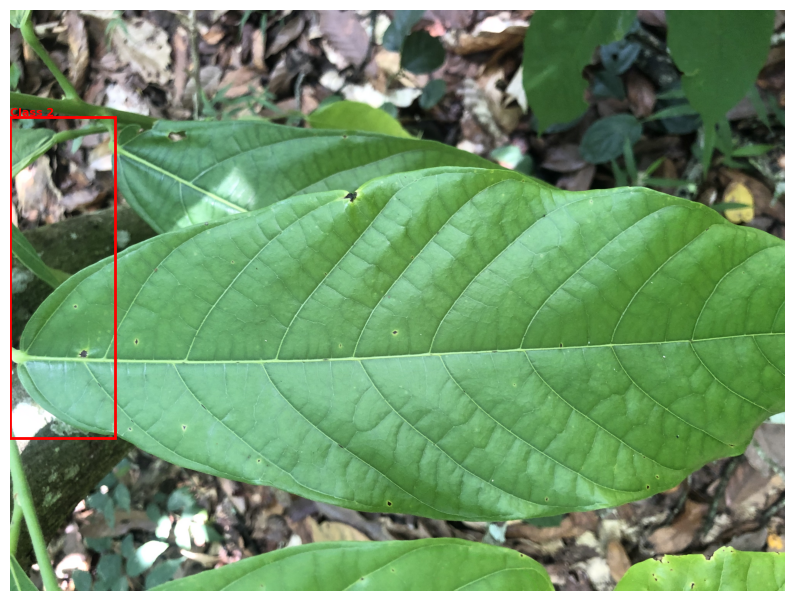

Plotting ID_VVx5jm.JPG with 2 bounding boxes.


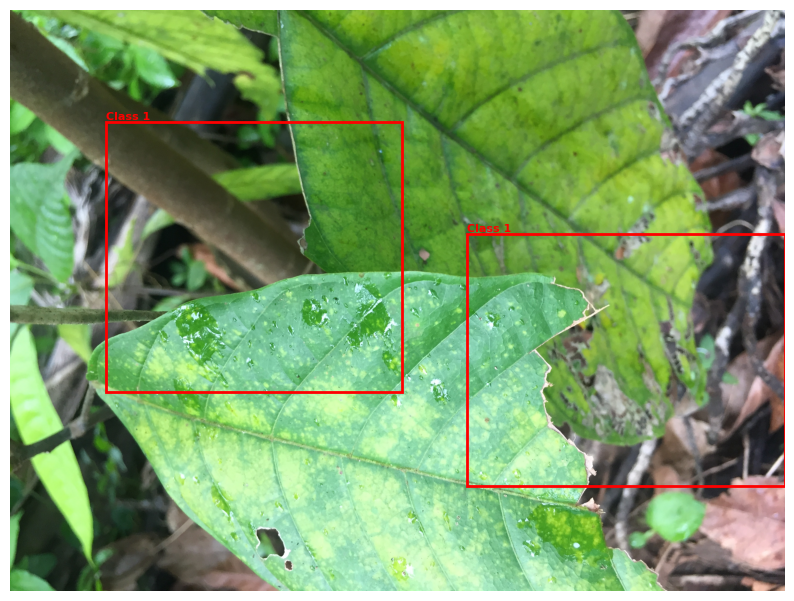

In [ ]:
# Plot some images and their bboxes to ensure the conversion was done correctly
def load_annotations(label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to plot an image with its bounding boxes
def plot_image_with_boxes(image_path, boxes):
    # Load the image
    image = np.array(Image.open(str(image_path)))


    # Get image dimensions
    h, w, _ = image.shape

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Plot each bounding box
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        # Convert YOLO format to corner coordinates
        xmin = int((x_center - width / 2) * w)
        ymin = int((y_center - height / 2) * h)
        xmax = int((x_center + width / 2) * w)
        ymax = int((y_center + height / 2) * h)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                          edgecolor='red', facecolor='none', linewidth=2))
        plt.text(xmin, ymin - 10, f'Class {int(class_id)}', color='red', fontsize=8, weight='bold')

    plt.axis('off')
    plt.show()

# Directories for images and labels
IMAGE_DIR = TRAIN_IMAGES_DIR
LABEL_DIR = TRAIN_LABELS_DIR

# Plot a few images with their annotations
for image_name in os.listdir(IMAGE_DIR)[:5]:
    image_path = IMAGE_DIR / image_name
    img_ext = image_name.split('.')[-1]
    label_path = LABEL_DIR / (image_name.replace(f'.{img_ext}', '.txt'))

    if label_path.exists():
        boxes = load_annotations(label_path)
        print(f"Plotting {image_name} with {len(boxes)} bounding boxes.")
        plot_image_with_boxes(image_path, boxes)
    else:
        print(f"No annotations found for {image_name}.")


In [ ]:
# Load a yolo pretrained model
model = YOLO('yolov8n.pt')

# Fine tune model to our data
model.train(
    data='data.yaml',          # Path to the dataset configuration
    epochs=10,                 # Number of epochs
    imgsz=1024,                # Image size (height, width)
    batch=8,                   # Batch size
    device=0,                  # Device to use (0 for the first GPU)
    patience=5)

100%|██████████| 6.25M/6.25M [00:00<00:00, 176MB/s]


Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=10, time=None, patience=5, batch=8, imgsz=1024, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None

100%|██████████| 755k/755k [00:00<00:00, 43.9MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 154MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset/labels/train... 4699 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4699/4699 [01:46<00:00, 44.04it/s]

train: WARNING ⚠️ /content/dataset/images/train/ID_AJD939.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_AMshRT.jpeg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_AOGygM.jpeg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_AbHMqL.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_AhmyiY.jpeg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_AhwlUp.jpeg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_AueB13.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_AzJAHH.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_BBZMEE.jpg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/train/ID_BFveJq.jpeg: corrupt JPEG restored and saved
train: WARNING ⚠️ /content/dataset/images/tra

train: New cache created: /content/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset/labels/val... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:20<00:00, 39.56it/s]

val: WARNING ⚠️ /content/dataset/images/val/ID_AYKor4.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_DEVBif.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_GWhiLp.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_H9qAYr.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_Hmxdwo.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_HuMwmi.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_J7hL2Y.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_JHsmyN.jpeg: corrupt JPEG restored and s

Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.53G      1.764      3.733      2.365          3       1024: 100%|██████████| 588/588 [07:19<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:08<00:00,  1.32s/it]


                   all        830       1556      0.411      0.373      0.328      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.47G      1.632      2.376      2.239          4       1024: 100%|██████████| 588/588 [06:59<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:15<00:00,  1.45s/it]


                   all        830       1556      0.509      0.425      0.417      0.174

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.46G      1.582      2.034      2.178          3       1024: 100%|██████████| 588/588 [07:23<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:11<00:00,  1.37s/it]

                   all        830       1556      0.564      0.431      0.456      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.47G      1.553      1.884      2.141          7       1024: 100%|██████████| 588/588 [06:59<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:12<00:00,  1.39s/it]

                   all        830       1556      0.577      0.469      0.501      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.47G      1.496      1.753      2.077          6       1024: 100%|██████████| 588/588 [07:19<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:04<00:00,  1.24s/it]

                   all        830       1556      0.644       0.51       0.56      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.47G      1.452      1.668      2.021          6       1024: 100%|██████████| 588/588 [07:11<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:07<00:00,  1.30s/it]

                   all        830       1556      0.657       0.55      0.587      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.47G      1.395      1.566      1.972          5       1024: 100%|██████████| 588/588 [06:59<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:11<00:00,  1.37s/it]

                   all        830       1556      0.695      0.577      0.627       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.56G      1.372      1.497       1.95          4       1024: 100%|██████████| 588/588 [07:06<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:06<00:00,  1.28s/it]

                   all        830       1556      0.706      0.561       0.63       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.47G      1.315      1.412      1.888          5       1024: 100%|██████████| 588/588 [07:16<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:12<00:00,  1.40s/it]

                   all        830       1556      0.719      0.606      0.664      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.46G      1.286      1.356      1.857          3       1024: 100%|██████████| 588/588 [07:01<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:13<00:00,  1.41s/it]

                   all        830       1556      0.752      0.585      0.661      0.408



10 epochs completed in 1.398 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:08<00:00,  1.31s/it]


                   all        830       1556       0.72      0.605      0.664      0.411
           anthracnose        252        385      0.765      0.568      0.656      0.394
                 cssvd        306        465      0.721      0.624      0.663      0.419
               healthy        272        706      0.673      0.623      0.673      0.422
Speed: 0.5ms preprocess, 5.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bcbdcb78410>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [ ]:
# Validate the model on the validation set
model = YOLO('/content/runs/detect/train/weights/best.pt')
results = model.val()

Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/dataset/labels/val.cache... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/dataset/images/val/ID_AYKor4.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_DEVBif.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_GWhiLp.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_H9qAYr.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_Hmxdwo.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_HuMwmi.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_J7hL2Y.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_JHsmyN.jpeg: corrupt JPEG restored and s


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [01:48<00:00,  2.08s/it]


                   all        830       1556      0.718      0.606      0.664      0.412
           anthracnose        252        385      0.766      0.568      0.657      0.395
                 cssvd        306        465       0.72      0.624      0.664      0.419
               healthy        272        706       0.67      0.626      0.673      0.422
Speed: 1.4ms preprocess, 8.2ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/val


In [ ]:
# Load the trained YOLO model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Path to the test images directory
test_dir_path = TEST_IMAGES_DIR

# Get a list of all image files in the test directory
image_files = os.listdir(test_dir_path)

# Initialize an empty list to store the results for all images
all_data = []

# Initialize an empty list to store the results for all images
all_data = []

# Iterate through each image in the directory
for image_file in tqdm(image_files):
    # Full path to the image
    img_path = os.path.join(test_dir_path, image_file)

    # Make predictions on the image
    results = model(img_path)

    # Extract bounding boxes, confidence scores, and class labels
    boxes = results[0].boxes.xyxy.tolist() if results[0].boxes else []  # Bounding boxes in xyxy format
    classes = results[0].boxes.cls.tolist() if results[0].boxes else []  # Class indices
    confidences = results[0].boxes.conf.tolist() if results[0].boxes else []  # Confidence scores
    names = results[0].names  # Class names dictionary

    if boxes:  # If detections are found
        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            detected_class = names[int(cls)]  # Get the class name from the names dictionary

            # Add the result to the all_data list
            all_data.append({
                'Image_ID': str(image_file),
                'class': detected_class,
                'confidence': conf,
                'ymin': y1,
                'xmin': x1,
                'ymax': y2,
                'xmax': x2
            })
    else:  # If no objects are detected
        all_data.append({
            'Image_ID': str(image_file),
            'class': "None",
            'confidence': None,
            'ymin': None,
            'xmin': None,
            'ymax': None,
            'xmax': None
        })



  0%|          | 0/1626 [00:00<?, ?it/s]


image 1/1 /content/dataset/images/test/ID_OSO5iu.jpeg: 1024x480 1 anthracnose, 53.6ms
Speed: 5.2ms preprocess, 53.6ms inference, 14.9ms postprocess per image at shape (1, 3, 1024, 480)

image 1/1 /content/dataset/images/test/ID_vY8dnC.jpg: 1024x768 1 cssvd, 58.6ms
Speed: 7.6ms preprocess, 58.6ms inference, 1.8ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /content/dataset/images/test/ID_tnbptN.jpg: 1024x768 1 cssvd, 11.2ms
Speed: 6.7ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /content/dataset/images/test/ID_jr7JD5.jpg: 1024x768 1 anthracnose, 11.2ms
Speed: 6.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /content/dataset/images/test/ID_OF78RK.jpeg: 1024x768 1 healthy, 12.4ms
Speed: 10.2ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /content/dataset/images/test/ID_vmENtL.jpg: 1024x768 1 cssvd, 11.3ms
Speed: 5.2ms

In [ ]:
# Convert the list to a DataFrame for all images
sub = pd.DataFrame(all_data)

In [ ]:
sub.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_OSO5iu.jpeg,anthracnose,0.646155,67.278854,3.224849,3809.542969,1761.843384
1,ID_vY8dnC.jpg,cssvd,0.840238,21.455917,82.457275,1219.288574,934.116089
2,ID_tnbptN.jpg,cssvd,0.600896,44.416656,196.671295,1216.658325,891.126831
3,ID_jr7JD5.jpg,anthracnose,0.550574,36.508423,0.000000,1951.020142,1314.458740
4,ID_OF78RK.jpeg,healthy,0.654045,66.082657,429.463135,3840.913086,2468.947510


In [ ]:
sub['class'].value_counts()

,count
class,
healthy,1187
cssvd,831
anthracnose,541
None,27


In [ ]:
# Create submission file to be uploaded to Zindi for scoring
sub.to_csv(f'{INPUT_DATA_DIR / "BenchmarkSubmission.csv"}', index = False)

In [ ]:
train['Image_ID'].nunique(), test['Image_ID'].nunique()

(5529, 1626)

In [ ]:
train_df['Image_ID'].nunique() + val_df['Image_ID'].nunique() + test['Image_ID'].nunique()

7155

In [ ]:
sub = pd.read_csv(f'{INPUT_DATA_DIR / "BenchmarkSubmission.csv"}')
sub.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_OSO5iu.jpeg,anthracnose,0.646155,67.278854,3.224849,3809.542969,1761.843384
1,ID_vY8dnC.jpg,cssvd,0.840238,21.455917,82.457275,1219.288574,934.116089
2,ID_tnbptN.jpg,cssvd,0.600896,44.416656,196.671295,1216.658325,891.126831
3,ID_jr7JD5.jpg,anthracnose,0.550574,36.508423,0.000000,1951.020142,1314.458740
4,ID_OF78RK.jpeg,healthy,0.654045,66.082657,429.463135,3840.913086,2468.947510


In [ ]:
## Make a dataframe from all entries in sub with no detection
no_detection = sub[~sub['class'].isin(['cssvd', 'healthy', 'anthracnose'])]
no_detection

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
20,ID_jiosRJ.jpeg,NaN,NaN,NaN,NaN,NaN,NaN
81,ID_PH0j4i.jpg,NaN,NaN,NaN,NaN,NaN,NaN
97,ID_fPR4u5.jpg,NaN,NaN,NaN,NaN,NaN,NaN
187,ID_XzSqhK.JPG,NaN,NaN,NaN,NaN,NaN,NaN
302,ID_ksM9yC.JPG,NaN,NaN,NaN,NaN,NaN,NaN
312,ID_Lpv49N.jpg,NaN,NaN,NaN,NaN,NaN,NaN
620,ID_Suoisd.JPG,NaN,NaN,NaN,NaN,NaN,NaN
674,ID_HiEYk8.jpg,NaN,NaN,NaN,NaN,NaN,NaN
808,ID_VhNzV9.jpeg,NaN,NaN,NaN,NaN,NaN,NaN
897,ID_PZvJCn.jpeg,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Get a random image from no_detection
rnd_no_detect_image = no_detection.sample(1)['Image_ID'].values[0]
rnd_no_detect_image

'ID_GM6Ads.JPG'

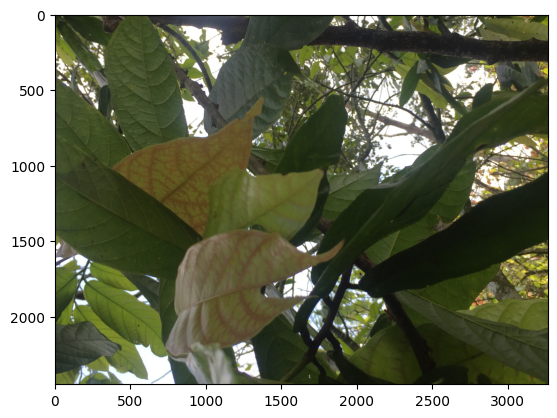

In [ ]:
# Plot the rnd_no_detect_image
image_path = TEST_IMAGES_DIR / rnd_no_detect_image
image = np.array(Image.open(str(image_path)))
plt.imshow(image);

In [ ]:
no_detection['Image_ID'].unique()

array(['ID_jiosRJ.jpeg', 'ID_PH0j4i.jpg', 'ID_fPR4u5.jpg', 'ID_XzSqhK.JPG', 'ID_ksM9yC.JPG', 'ID_Lpv49N.jpg', 'ID_Suoisd.JPG', 'ID_HiEYk8.jpg', 'ID_VhNzV9.jpeg', 'ID_PZvJCn.jpeg', 'ID_UzoTeR.jpg', 'ID_Fb4rRp.jpg', 'ID_R6trN8.jpeg', 'ID_rcw57Y.JPG', 'ID_EcA6Hq.jpg', 'ID_jLLLAF.jpg', 'ID_T22A5T.jpg', 'ID_GSj4su.jpeg',
       'ID_NgQOzy.jpeg', 'ID_GM6Ads.JPG', 'ID_anegvH.jpeg', 'ID_G0OzBp.jpg', 'ID_nuUNo0.jpg', 'ID_bqjNRc.JPG', 'ID_xGu1Jv.JPG', 'ID_G88tEZ.JPG', 'ID_V4uHkL.jpeg'], dtype=object)

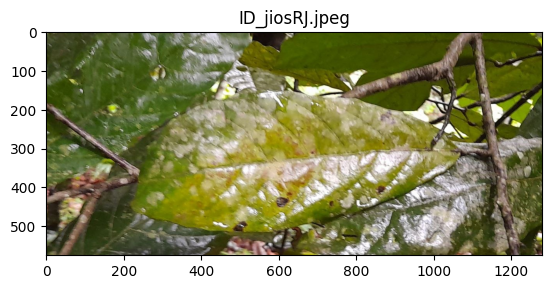

--------------------------------------



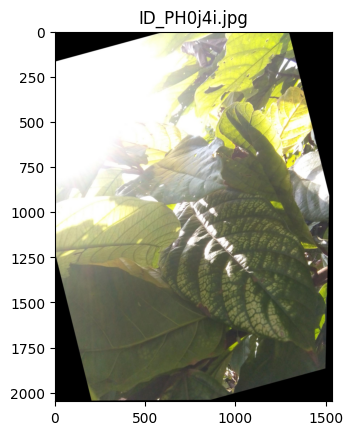

--------------------------------------



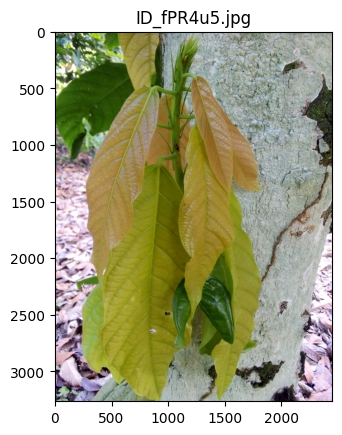

--------------------------------------



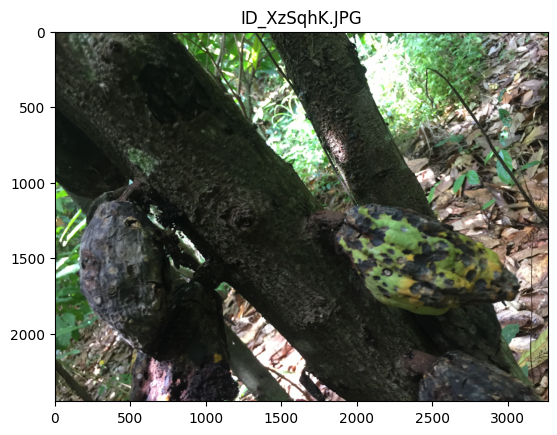

--------------------------------------



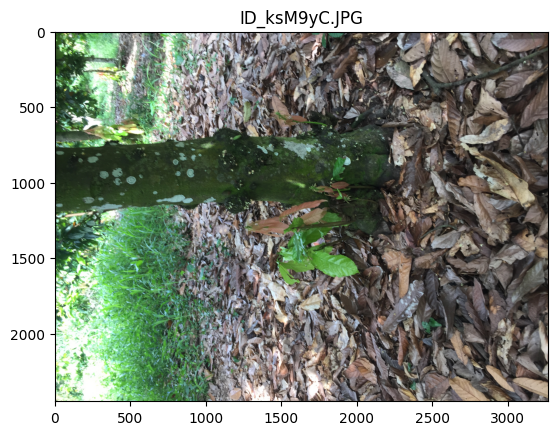

--------------------------------------



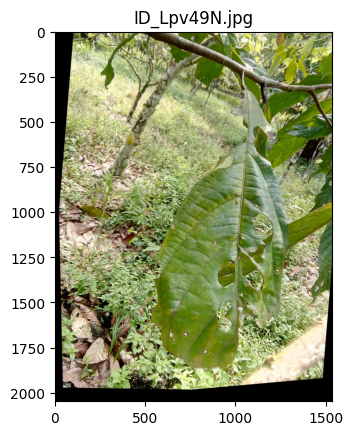

--------------------------------------



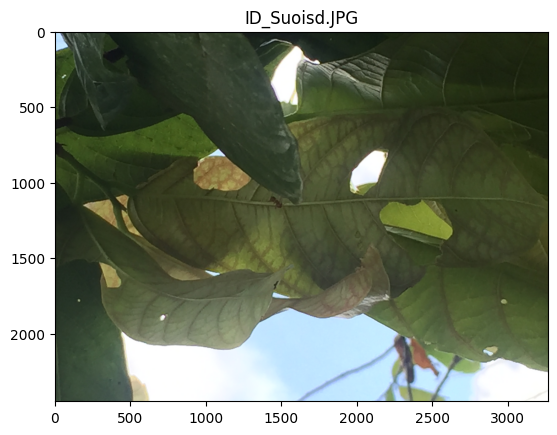

--------------------------------------



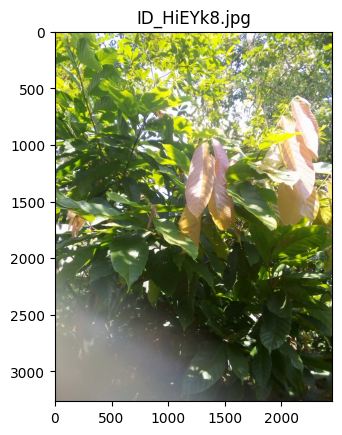

--------------------------------------



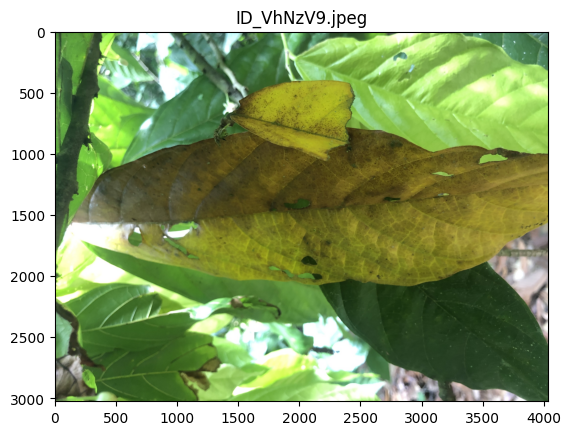

--------------------------------------



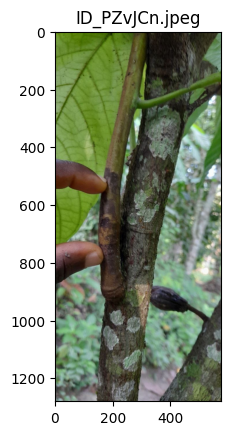

--------------------------------------



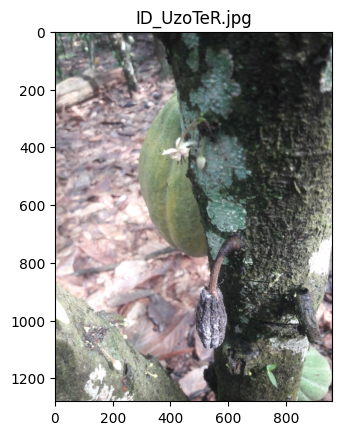

--------------------------------------



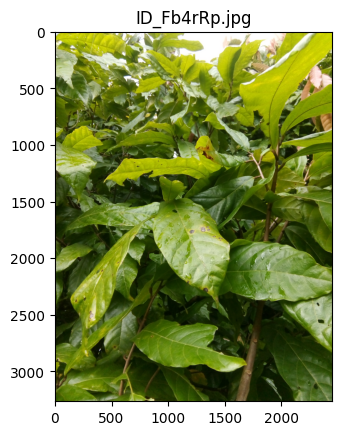

--------------------------------------



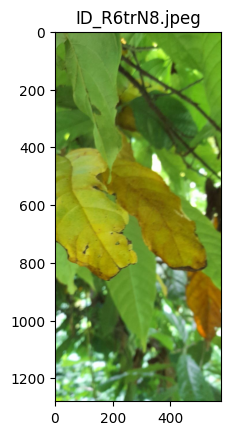

--------------------------------------



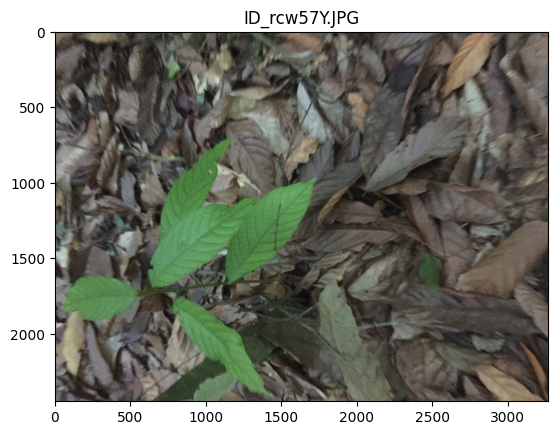

--------------------------------------



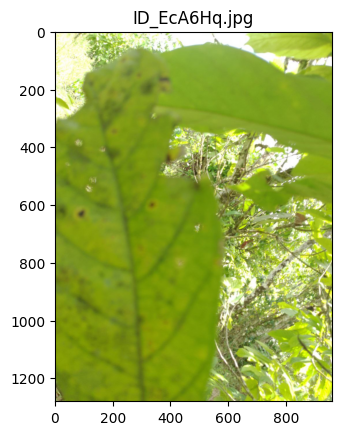

--------------------------------------



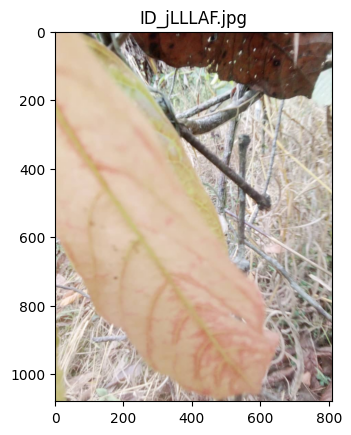

--------------------------------------



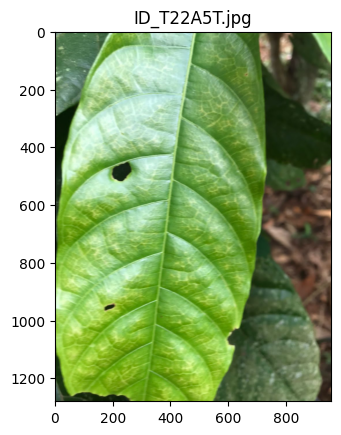

--------------------------------------



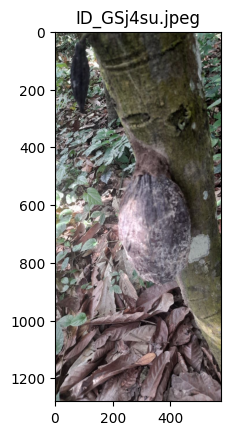

--------------------------------------



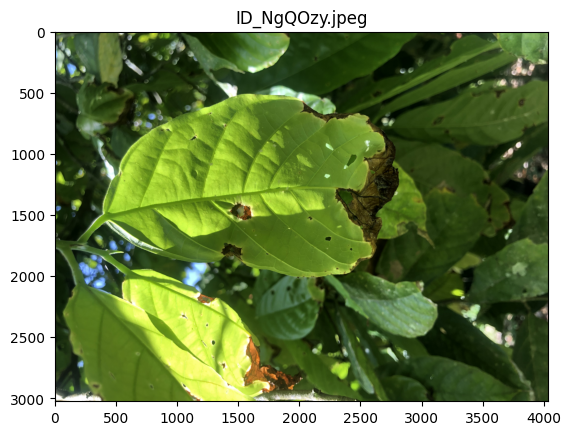

--------------------------------------



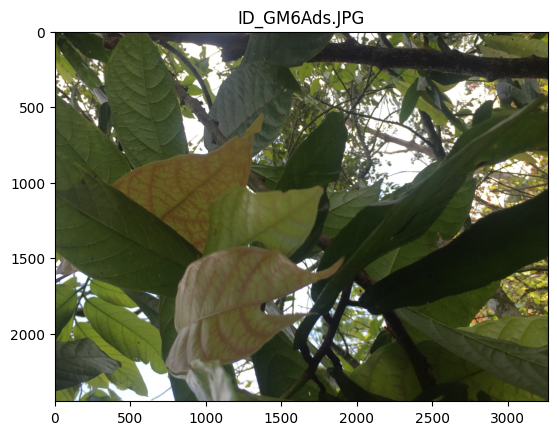

--------------------------------------



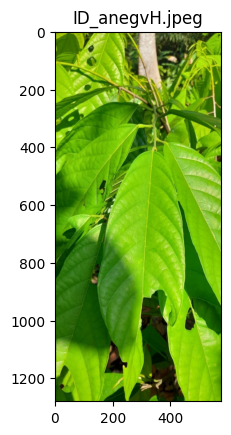

--------------------------------------



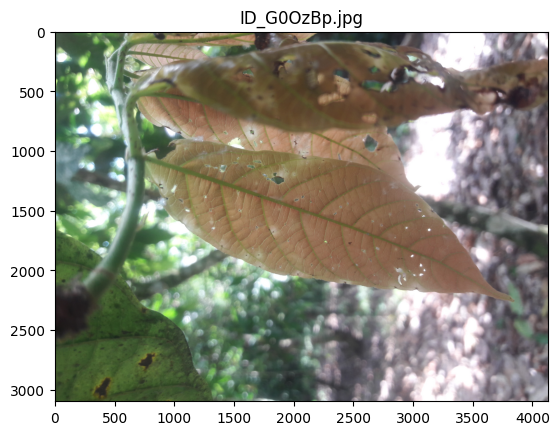

--------------------------------------



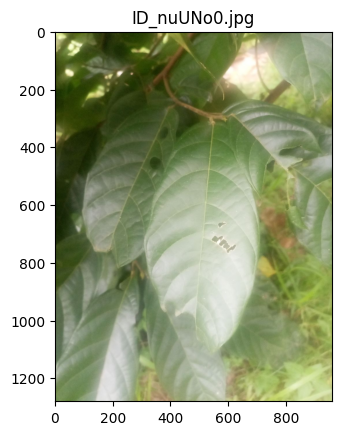

--------------------------------------



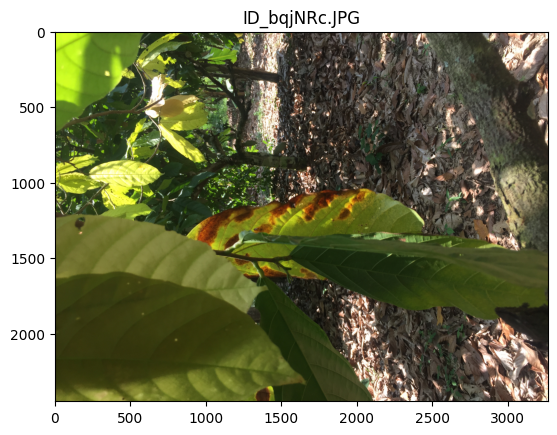

--------------------------------------



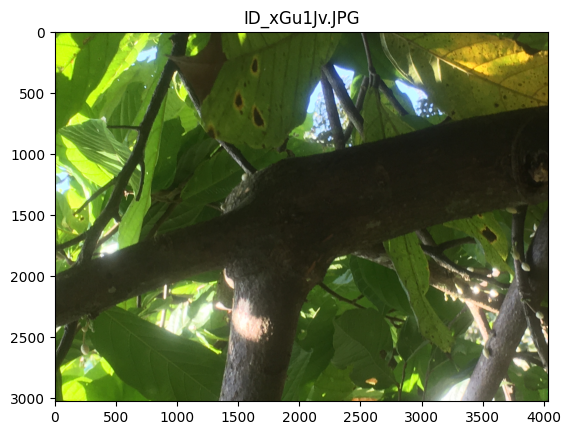

--------------------------------------



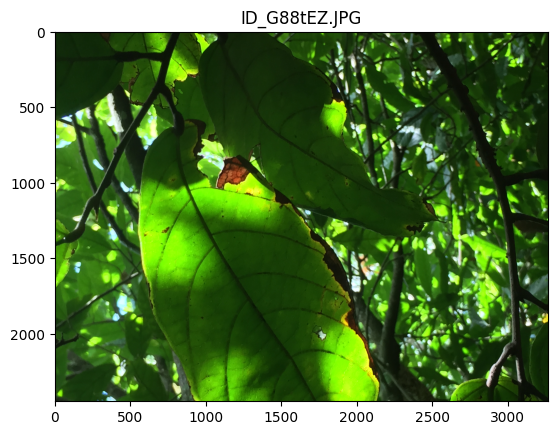

--------------------------------------



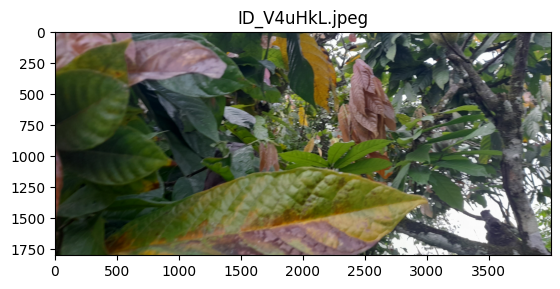

--------------------------------------



In [ ]:
# Plot each of the image in no_detection dataframe
for image_name in no_detection['Image_ID'].unique():
    image_path = TEST_IMAGES_DIR / image_name
    plt.title(image_name)
    image = np.array(Image.open(str(image_path)))
    plt.imshow(image)
    plt.show()
    print('--------------------------------------\n')